# Customer clustering analysis

This notebook presents a comprehensive analysis of customer segmentation using clustering techniques. The goal of this analysis is to identify distinct groups of customers based on their behaviors, which can help in understanding the underlying patterns within the customer base and optimizing marketing strategies. By leveraging clustering methods, we aim to identify meaningful customer segments, and subsequently, we use classification techniques to explore how demographic variables can predict cluster membership.
After preprocessing the data, we will use:
- Principal Component Analysis to reduce dimensionality
- K-means algorithm togheter with the elbow method and silhuoette score to determine the correct number of cluster. 
- Hierarchical clustering
- ending with Random forest for classification

The dataset used for this analysis, titled "Customer Personality Analysis," was sourced from Kaggle and provides a range of customer attributes, including demographic information, product preferences, and spending habits. 
This analysis aims to provide valuable insights into customer behavior, enabling businesses to tailor their marketing efforts and enhance customer satisfaction.
For example, instead of spending money to market a new product to every customer in the company’s database, a company can analyze which customer segment is most likely to buy the product and then market the product only on that particular segment


## Importing libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import altair as alt
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score, accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import Normalizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import warnings
warnings.filterwarnings('ignore')

## Importing the Data

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d imakash3011/customer-personality-analysis
!unzip customer-personality-analysis.zip
!rm customer-personality-analysis.zip


In [2]:
data = pd.read_csv('marketing_campaign.csv', sep='\t')

In [3]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


## EDA

We find that there are 3 factorial variables.

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

There are few missing values in the Income variable. We will simply drop them.

In [5]:
data.dropna(inplace=True)

In [6]:
data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,...,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.0,2216.0,2216.000000
mean,5588.353339,1968.820397,52247.251354,0.441787,0.505415,49.012635,305.091606,26.356047,166.995939,37.637635,...,5.319043,0.073556,0.074007,0.073105,0.064079,0.013538,0.009477,3.0,11.0,0.150271
std,3249.376275,11.985554,25173.076661,0.536896,0.544181,28.948352,337.327920,39.793917,224.283273,54.752082,...,2.425359,0.261106,0.261842,0.260367,0.244950,0.115588,0.096907,0.0,0.0,0.357417
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2814.750000,1959.000000,35303.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,174.500000,8.000000,68.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8421.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


Z_CostContact and Z_Revenue are constants, we can remove them.

In [7]:
data = data.drop(['Z_CostContact',	'Z_Revenue'], axis=1)

Year_Birth and Income looks to have some outliers. We will drop them.

In [8]:
alt.Chart(data).mark_boxplot().encode(
    x=alt.X('Year_Birth',timeUnit='year',  scale=alt.Scale(domain=[1900,2020])),
) & alt.Chart(data).mark_boxplot().encode(
    x=alt.X('Income',timeUnit='year'),
)


alt.VConcatChart(...)

In [9]:
data = data[data.Year_Birth >= 1920]
data = data[data.Income <= 500000]

### Semantic groups of columns

Looking deeper in the meaning of the variables, we find that we can split the columns in a semantic way to apply a different preprocessing and analysis to different part of the data. 

In [10]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response'],
      dtype='object')

- ID: Customer's unique identifier  
- Dt_Customer: Date of customer's enrollment with the company  
- Recency: Number of days since customer's last purchase  
- Complain: 1 if the customer complained in the last 2 years, 0 otherwise  

People (demographics)

- Year_Birth: Customer's birth year  
- Education: Customer's education level  
- Marital_Status: Customer's marital status  
- Income: Customer's yearly household income  
- Kidhome: Number of children in customer's household  
- Teenhome: Number of teenagers in customer's household  

Product preferencies

- MntWines: Amount spent on wine in last 2 years  
- MntFruits: Amount spent on fruits in last 2 years  
- MntMeatProducts: Amount spent on meat in last 2 years  
- MntFishProducts: Amount spent on fish in last 2 years  
- MntSweetProducts: Amount spent on sweets in last 2 years  
- MntGoldProds: Amount spent on gold in last 2 years  

Response to offers  

- AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise  
- AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise  
- AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise  
- AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise  
- AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise  
- Response: 1 if customer accepted the offer in the last campaign, 0 otherwise  

Place preferencies (if a customer prefer to buy by catalog, online or in the phisical store) 

- NumDealsPurchases: Number of purchases made with a discount  
- NumWebPurchases: Number of purchases made through the company’s website  
- NumCatalogPurchases: Number of purchases made using a catalogue  
- NumStorePurchases: Number of purchases made directly in stores  
- NumWebVisitsMonth: Number of visits to company’s website in the last month  

In [11]:
people = list(data.columns[1:7])
print('People: ', people)
product = [x for x in data.columns if x.startswith('Mnt')]
print('Product: ',product)
place = [x for x in data.columns if (x.startswith('Num') and x != 'NumWebVisitsMonth')]
print('Place: ', place)
promotion = [x for x in data.columns if x.startswith('Accepted')]+['Response']
print('Promotion: ', promotion)

People:  ['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome']
Product:  ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
Place:  ['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']
Promotion:  ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Response']


These are the columns splitted in a meaningful way. it will help our analysis.
We will cluster the customers by Product, Place and Promotion. In the end we will classify them in the clusters by People(by demographics).

#### Product preferencies  
This group of variables describes the spending behaviours of customers, based on the product preferencies.

In [12]:
data[product].head()

,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
0,635,88,546,172,88,88
1,11,1,6,2,1,6
2,426,49,127,111,21,42
3,11,4,20,10,3,5
4,173,43,118,46,27,15


We normalize the values for single product to have sum 1 in every row, and we store the total amounts spent trough different products in a new 'product_sum' variable.

In [13]:
data['product_sum'] = data[product].sum(axis=1)
normalizer = Normalizer(norm='l1')
data[product] = normalizer.fit_transform(data[product])

In [14]:
product_titles=[]
product_charts=[]
for i, col in enumerate(product):
    title = alt.Chart().mark_text(align='right', dx=5).encode(
        text=alt.value(col)
    )
    chart = alt.Chart(data[product]).mark_boxplot().encode(
        x = alt.X(col, title=None, scale=alt.Scale(type='sqrt'))#, axis=None if i<len(product)-1 else alt.Axis(title=None))
    )
    product_charts.append(chart)
    product_titles.append(title)
alt.hconcat(alt.vconcat(*product_titles), 
            alt.vconcat(*product_charts,
                        spacing=0
                        ).resolve_scale(x='shared')
)

alt.HConcatChart(...)

Wines are the best seller products, followed by meat products.
We can look to interactions among different classes of products. Interestingly we can see that high wines spending correspond to low level of spendings on other products.

In [15]:
alt.Chart(data).mark_point().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative')
).properties(
    width=200,
    height=200
).repeat(
    row=product,
    column=product[::-1]
)

alt.RepeatChart(...)


#### Place preferencies  
This group of variables describes the preferencies about the place for spending. Some people prefer to buy on the website, other in the physical store...

In [16]:
data[place].head()

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases
0,3,8,10,4
1,2,1,1,2
2,1,8,2,10
3,2,2,0,4
4,5,5,3,6


We normalize this data by row.

In [17]:
data[place] = normalizer.fit_transform(data[place])

In [18]:
product_titles=[]
product_charts=[]
for i, col in enumerate(place):
    title = alt.Chart().mark_text(align='right', dx=5).encode(
        text=alt.value(col)
    )
    chart = alt.Chart(data[place]).mark_boxplot().encode(
        x = alt.X(col, title=None, scale=alt.Scale(type='sqrt'))#, axis=None if i<len(product)-1 else alt.Axis(title=None))
    )
    product_charts.append(chart)
    product_titles.append(title)
alt.hconcat(alt.vconcat(*product_titles), 
            alt.vconcat(*product_charts,
                        spacing=0
                        ).resolve_scale(x='shared')
)


alt.HConcatChart(...)

We can see that store Purchases are the most frequent, followed by Web purchases.
And again we can look at the pairwise plots, to see the correlations.

In [19]:
alt.Chart(data).mark_point().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative')
).properties(
    width=200,
    height=200
).repeat(
    row=place,
    column=place[::-1]
)

alt.RepeatChart(...)

#### Promotion response
About the promotion response, we just summarize the information in a promo variable, summing up the response in every offer campaign.

In [20]:
data[promotion].head()

,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response
0,0,0,0,0,0,1
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,0


In [21]:
data['promo'] = data[promotion].sum(axis=1)

### Correlation matrix

In [22]:
columns = product + place + ['product_sum', 'promo']

corr_mat = data[columns].corr().reset_index().melt(id_vars='index')
heat_map = alt.Chart(corr_mat, title='Correlation Matrix').mark_rect().encode(
    alt.X('index:N'),
    alt.Y('variable:N'),
    alt.Color('value:Q', scale=alt.Scale(scheme='viridis')),
).properties(
    width=750,
    height=750
)

text = alt.Chart(corr_mat).mark_text(baseline='middle').encode(
    alt.Text('value:Q', format=".2f"),
    alt.X('index:N'),
    alt.Y('variable:N')
)

heat_map + text


alt.LayerChart(...)

Summing up:  
- the Wines spending amount is negatively correlated to the amounts of all the other categories of products.
- the product_sum (total amount of spending) is strongly correlated to NumCatalogPurchases and negatively correlated to NumDealsPurchases.  
- NumWebPurchases is negatevely correlated to NumStorePurchases.  
- MntGoldProds is negatevely correlated to prosuct_sum.  


#### Selecting variables for clustering  
We want to conduct clustering based on a subgroup of variables that describe the spending behaviours of the customer.
This is the group of variables we want to take in consideration.

In [23]:
columns = product + place + ['product_sum', 'promo']
X = data[columns]


#### Standardize features by removing the mean and scaling to unit variance.


In [24]:
scaler_std = StandardScaler()
X_std = scaler_std.fit_transform(X)

In [25]:
pca = PCA().fit(X_std)

ex_var_ratio =pd.DataFrame(enumerate(np.cumsum(pca.explained_variance_ratio_)), columns=['Principal Component', 'Cumulative Explained Variance'])
baseplt = alt.Chart(ex_var_ratio).mark_line().encode(
    x='Principal Component',
    y='Cumulative Explained Variance',)
baseplt+alt.Chart(ex_var_ratio).mark_line(color='red').encode(
    y=alt.datum(0.9),
    x=alt.X('Principal Component:Q')
)


alt.LayerChart(...)

we find that 7 variables over 11 in the design matrix, explain 90% of the variance in the data. So we reduce the dataset to 7 components.

In [26]:
for i,x in enumerate(pca.explained_variance_ratio_.cumsum()):
  if x > 0.9:
    print(f'N components: {i}')
    break
X_reduced = PCA(n_components=i, random_state=11).fit_transform(X_std)

N components: 7


## Determine the number of clusters to be formed

We use the elbow method and the silhouette score to choose the best number of clusters. 

In [27]:

sse = {}
sil = []
for k in range(2, 18):
  kmeans = KMeans(n_clusters = k, random_state=29).fit(X_reduced)
  sil.append(silhouette_score(X_reduced, kmeans.labels_, metric = 'euclidean'))
  sse[k] = kmeans.inertia_
sil_df = pd.DataFrame(enumerate(sil), columns=['k', 'value']).assign(method='Silhouette score')
elb_df = pd.DataFrame(sse.items(), columns=['k', 'value']).assign(method='Elbow')

alt.Chart(pd.concat([sil_df, elb_df]).reset_index(drop=True)).mark_line().encode(
    x='k',
    y='value',
    color='method'
    ).facet('method', columns=1
            ).resolve_axis(
                y='independent'
            ).resolve_scale(
                y='independent'
            )


alt.FacetChart(...)

3 clusters seems to be a reasonable choice looking at the charts.

## Hierarchical Clustering

We aim to create clusters of clients based on their spending behaviour, then we want to use classification based on the demographics to predict customer's cluster. 
We use AgglomertiveClustering for hierarchical clustering using 3 clusters.

In [28]:
hclust = AgglomerativeClustering(n_clusters = 3).fit_predict(X_reduced)
data['cluster'] = hclust

We have a look at how the product preferencies are distributed in the 3 clusters

In [29]:
product_chart = alt.Chart(data).mark_boxplot().encode(
    alt.Y(alt.repeat("column"), type='quantitative', scale=alt.Scale(type='sqrt')),
    alt.X('cluster:N'),
    alt.Color('cluster:N')
).repeat(
    column=list(product)
).resolve_scale(
    y='shared'
)

sum_product_chart = alt.Chart(data).mark_bar().encode(
    alt.X('mean(product_sum):Q'),
    alt.Y('cluster:N'),
    alt.Color('cluster:N')
)

product_chart & sum_product_chart

alt.VConcatChart(...)

we have 3 colors for the 3 clusters. We can say:

Cluster 0: Low Expenditure   
Cluster 1: High Expenditure   
Cluster 2: Medium Expenditure  
Wines and meat are the best sellers for all the clusters, but we can see some differences in preferencies, for example cluster 0 spends an higher percent of total on gold products respect the others

we can see how the response to the promo are distributed over clusters

In [30]:
promo_chart = alt.Chart(data).mark_bar().encode(
    alt.X('mean(promo):Q'),
    alt.Y('cluster:N'),
    alt.Color('cluster:N')
)
promo_chart

alt.Chart(...)

and the distribution of the place preferencies

In [31]:
place_chart = alt.Chart(data).mark_boxplot().encode(
    alt.Y(alt.repeat("column"), type='quantitative', scale=alt.Scale(type='sqrt')),
    alt.X('cluster:N'),
    alt.Color('cluster:N')
).repeat(
    column=list(place)
).resolve_scale(
    y='shared'
)
place_chart

alt.RepeatChart(...)

Group 0: high Store Purchases   
Group 1: High store and high catalog purchases  
Group 2: high store and web purchases  

## Analysis of demographics by clusters and classification

after the definition of clusters based on clients behaviours, we can try to understand how the demographics information are distributed among the clusters to see if it is possible to classify the clients in advance based only on the demographic information in the early stage of the enrolling.  
The clusters look to be balanced enough

In [32]:
alt.Chart(data).mark_bar().encode(
    alt.Y('cluster:N'),
    alt.Color('cluster:N'),
    alt.X('count()')
)

alt.Chart(...)

this is how the education and marital status are distributed trough the clusters

In [33]:
## Categorical factors
# The Education factor can be changed to an ordinal categorical type.

Education_order = ['Basic', '2n Cycle', 'Graduation', 'Master', 'PhD']
data['Education'] = pd.Categorical(data.Education, Education_order)
edu_chart = alt.Chart(data).mark_bar().encode(
    alt.Y('Education',sort=Education_order),
    alt.X('count()'),
    alt.Row('cluster:N'),
    alt.Color('cluster:N'),
    tooltip = ['Education', 'count()']
)

# I will change 'Alone' to 'Single' and remove the rows for 'YOLO' and 'Absurd' value.
data.loc[data.Marital_Status == 'Alone', 'Marital_Status'] = 'Single'
data = data[data.Marital_Status != 'Absurd']
data = data[data.Marital_Status != 'YOLO']
marital_chart = alt.Chart(data).mark_bar().encode(
    alt.Y('Marital_Status'),
    alt.X('count()'),
    alt.Row('cluster:N'),
    alt.Color('cluster:N'),
    tooltip = ['Marital_Status', 'count()']
)
edu_chart | marital_chart


alt.HConcatChart(...)

and this is how the number of children is distributed

In [34]:
kid_chart = alt.Chart(data).mark_bar().encode(
        alt.Y('Kidhome:O'),
        alt.X('count()'), 
        alt.Row('cluster:N'),
        alt.Color('cluster:N')
    )
teen_chart = alt.Chart(data).mark_bar().encode(
        alt.Y('Teenhome:O'),
        alt.X('count()'),
        alt.Row('cluster:N'),
        alt.Color('cluster:N')
    )
kid_chart | teen_chart

alt.HConcatChart(...)

and the age and income

In [35]:
age_chart = alt.Chart(data).mark_bar().encode(
    alt.Y('Year_Birth:Q', bin=alt.Bin(maxbins=6)),
    alt.X('count()'),
    alt.Row('cluster:N'),
    alt.Color('cluster:N')
)
income_chart = alt.Chart(data).mark_bar().encode(
    alt.Y('Income:Q', bin=alt.Bin(maxbins=10)),
    alt.X('count()'),
    alt.Row('cluster:N'),
    alt.Color('cluster:N')
)
age_chart | income_chart

alt.HConcatChart(...)

#### Encoding categorical factors
we will apply random forest classification to demographic data using clusters we defined earlier as labels.  
we need to encode categorical variables

In [36]:
X = data[people].copy()
enc_ord=OrdinalEncoder()
X[['Education']] = enc_ord.fit_transform(X[['Education']])

enc_one=OneHotEncoder(drop='first', sparse_output=False)
df = pd.DataFrame(enc_one.fit_transform(X[['Marital_Status']]),
                               index=X.index,
                               columns=enc_one.get_feature_names_out())
X[df.columns] = df
X.drop('Marital_Status', axis=1, inplace=True)


In [37]:
y = data['cluster']

#### Classification
we make some optimization of hyperparameters using GridSearchCV, and we measure the accuracy

In [38]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)

In [42]:
parameters = dict(n_estimators=[200, 300],
        criterion=['gini', 'entropy'],
        max_depth=[None, 2, 5, 10],
        min_samples_split=[2, 5, 10],
        min_samples_leaf=[1, 2, 4])

rndf = RandomForestClassifier()
clf = GridSearchCV(rndf, parameters)
clf.fit(X_train, y_train)
print('Train: ', clf.best_score_, clf.best_params_)

Train:  0.7180622995877233 {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}


In [43]:
clf.score(X_test, y_test)

0.7023319615912208

we get the 70% of accuracy predicting the cluster by demographics.

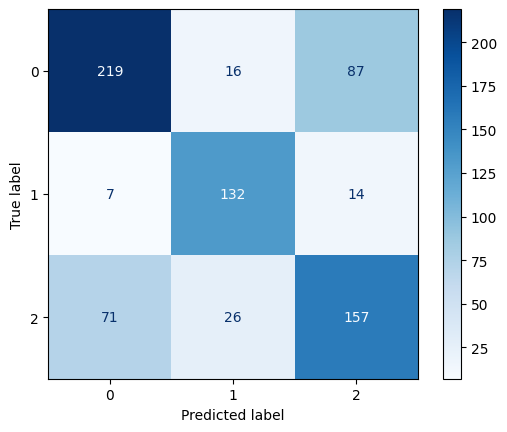

In [41]:
ConfusionMatrixDisplay.from_estimator(
        clf,
        X_test,
        y_test,
        cmap=plt.cm.Blues
    )


## Conclusions  
So after a comprehensive analysis of customer segmentation through clustering techniques we explored the relationship between these clusters and demographic variables.  
The clustering analysis successfully identified distinct customer groups, each characterized by unique purchasing behaviors and preferences.  
Following the clustering, a classification analysis based on demographic features such as age, income, and education level, revealed significant relationships between these variables and the identified clusters.  
 This connection between demographic factors and customer behavior underscores the importance of personalized marketing strategies.    
The results of this analysis can be used to enhance targeted marketing efforts, improve customer engagement, and ultimately drive business growth. By understanding the specific needs and preferences of different customer segments, companies can tailor their offerings and communications more effectively.  